In [400]:
# importing libraries
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt

# Task 1

In [401]:
# defining a class for the Kernel Density Estimation

class KDE:

    def __init__(self, kernel_type):
        self.kernel_type = kernel_type # selection of kernel type

    # fit the data
    def fit(self, X, bandwidth):
        self.X = X
        self.h = bandwidth
        self.N = len(X) # number of samples
        self.d = len(X[0]) # dimension of the samples

    # defining the kernel functions
    def gaussian_function(self, x):
        gauss = []
        for i in range(x.shape[0]):
            gauss.append((1/((2*np.pi)** (self.d/2)))*np.exp(-0.5*(np.dot(x[i], x[i]))))
        return np.array(gauss)
    
    def box_function(self, x):
        box = []
        for i in range(x.shape[0]):
            if np.abs(x[i]) <= 0.5:
                box.append(1)
            else:
                box.append(0)
        return np.array(box)
    
    def triangle_function(self,x):
        triangle = []
        for i in range(x.shape[0]):
            if np.abs(x[i]) <= 1:
                triangle.append(1-np.abs(x[i]))
            else:
                triangle.append(0)
        return np.array(triangle)
    
    def predict(self, x, X_temp):
        sum=0
        t = (x - X_temp)/self.h
        if self.kernel_type == 'gaussian':
            sum = np.sum(self.gaussian_function(t))
        elif self.kernel_type == 'box':
            sum = np.sum(self.box_function(t))
        elif self.kernel_type == 'triangle':
            sum = np.sum(self.triangle_function(t))
        return sum/(self.N*self.h**self.d)
    
    # finding the bandwidth
    def pseudologlikelihood(self):
        densities = []
        for i in range(self.N):
            X_temp = np.delete(self.X, i, axis=0)
            densities.append(np.log(self.predict(self.X[i,:], X_temp)))
        score = np.sum(densities)/self.N
        return score
    
    # evaluates density of a given point in the data. So just take ith index of the data
    def helper_function(self, X):
        return np.array([self.predict(x, self.X) for x in X])

    # visualise the data
    def visualisedata(self , X):

        densities = self.helper_function(X)

        if self.d == 1:
            plt.scatter(self.X, np.zeros(self.N), c='r', s=10)
            plt.scatter(X, densities, c='g', s=10)
            plt.show()
            plt.close()
                

        elif self.d == 2:
            fig = plt.figure()
            ax = fig.add_subplot(111, projection='3d')
            ax.scatter(self.X[:,0], self.X[:,1], np.zeros(self.N), c='r', s=10)
            ax.scatter(X[:,0], X[:,1], densities, c='g', s=10)
            plt.show()
            plt.close()

        else:
            print("Cannot plot for more than 2 dimensions")
    

In [402]:
data = np.random.randn(100,2) # creating a random dataset

Best bandwidth:  0.5


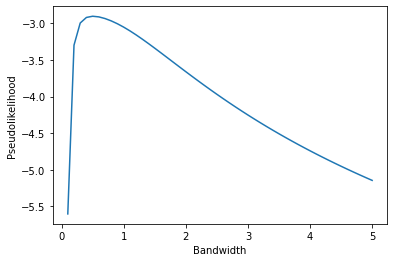

In [403]:
# get the pseudolikelihood score
# take a continuous distribution for bandwidth

bandwidths = np.linspace(0.1, 5, 50)
scores = []

for b in bandwidths:
    kde = KDE( kernel_type='gaussian')
    kde.fit(data, b)
    scores.append(kde.pseudologlikelihood())

plt.plot(bandwidths, scores)
plt.xlabel('Bandwidth')
plt.ylabel('Pseudolikelihood')

# get the best bandwidth
best_bandwidth = bandwidths[np.argmax(scores)]
print("Best bandwidth: ", best_bandwidth)

In [404]:
kde_best = KDE(kernel_type='gaussian')
kde_best.fit(data, best_bandwidth)

# predict density at a point
x_sample = [np.random.randn(2)]
print("Sample point: ", x_sample)
dens = kde.predict(x_sample, data)
print("Density at x_sample: ", dens)

Sample point:  [array([ 0.66734861, -1.53312447])]
Density at x_sample:  0.005772397576702442


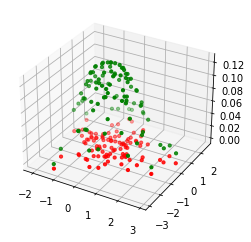

In [405]:
kde_best.visualisedata(data)

# Task 2

### My Code from Assignment 2

In [406]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram , linkage

In [407]:
image_no = 29
csv_path = './CSV/TLBR_' +  str(image_no) + '.csv'
df = pd.read_csv(csv_path)
image_path = './images/' + str(image_no) + '.jpg'
img = cv2.imread(image_path)

In [408]:
def visualize_bboxes(img):
  img_2 = img.copy()
  for index, rows in df.iterrows():
    top_left = (int(rows['Top-Left'].split(',')[0][1:]),int(rows['Top-Left'].split(',')[1][:-1]))
    bottom_right = (int(rows['Bottom-Right'].split(',')[0][1:]),int(rows['Bottom-Right'].split(',')[1][:-1]))
    cv2.rectangle(img_2, top_left, bottom_right, (255, 0, 0), 2)

    plt.imshow(img_2)

In [409]:
def make_connections(image, euclidean):

  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  image_with_boxes = image_rgb.copy()

  for index, row in euclidean.iterrows():
      left = int(row['Left'][0])
      right = int(row['Right'][0])
      top = int(row['Top'][1])
      bottom = int(row['Bottom'][1])
      box_id = int(row['Id'])

      width = right - left
      height = bottom - top

      top_left = (left, top)
      bottom_right = (right, bottom)

      cv2.rectangle(image_with_boxes, top_left, bottom_right, (255, 0, 0), 2)

      label_position = (left, top - 10)
      cv2.putText(image_with_boxes, str(box_id), label_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

      top_adjacent_id = int(row['Top_Box'][1])
      bottom_adjacent_id = int(row['Bottom_Box'][1])
      left_adjacent_id = int(row['Left_Box'][1])
      right_adjacent_id = int(row['Right_Box'][1])

      if top_adjacent_id != 0:
          top_adjacent_row = euclidean[euclidean['Id'] == top_adjacent_id].iloc[0]
          top_adjacent_center = int(top_adjacent_row['Bottom'][0]) , int(top_adjacent_row['Bottom'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(top)), top_adjacent_center, (0, 255, 0), 2)

      if bottom_adjacent_id != 0:
          bottom_adjacent_row = euclidean[euclidean['Id'] == bottom_adjacent_id].iloc[0]
          bottom_adjacent_center = int(bottom_adjacent_row['Top'][0]) , int(bottom_adjacent_row['Top'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(bottom)), (int(bottom_adjacent_center[0]), int(bottom_adjacent_center[1])), (0, 255, 0), 2)

      if left_adjacent_id != 0:
          left_adjacent_row = euclidean[euclidean['Id'] == left_adjacent_id].iloc[0]
          left_adjacent_center = int(left_adjacent_row['Right'][0]) , int(left_adjacent_row['Right'][1])
          cv2.line(image_with_boxes, (int(left), int(top) + height // 2), (int(left_adjacent_center[0]), int(left_adjacent_center[1])), (0, 255, 0), 2)

      if right_adjacent_id != 0:
          right_adjacent_row = euclidean[euclidean['Id'] == right_adjacent_id].iloc[0]
          right_adjacent_center = int(right_adjacent_row['Left'][0]) , int(right_adjacent_row['Left'][1])
          cv2.line(image_with_boxes, (int(right), int(top) + height // 2), (int(right_adjacent_center[0]), int(right_adjacent_center[1])), (0, 255, 0), 2)

  return image_with_boxes


In [410]:
df_temp = df.copy()
x_center = []
y_center = []

for row in df_temp.iterrows():
    row_id = row[1]['Id']
    row_df = df_temp[df_temp['Id'] == row_id]

    top = int(row_df['Top-Left'].iloc[0].split(',')[1][:-1])
    bottom = int(row_df['Bottom-Right'].iloc[0].split(',')[1][:-1])
    left = int(row_df['Top-Left'].iloc[0].split(',')[0][1:])
    right = int(row_df['Bottom-Right'].iloc[0].split(',')[0][1:])

    center_x = (left + right) // 2
    center_y = (top + bottom) // 2
    x_center.append(center_x)
    y_center.append(center_y)

x_center = np.array(x_center)
y_center = np.array(y_center)

In [411]:
# finding the absolute distance between points
x_center_abs = np.zeros((len(x_center), len(x_center)))
y_center_abs = np.zeros((len(y_center), len(y_center)))

for i in range(0,len(x_center)):
    for j in range(i, len(x_center)):
        dist_x = np.absolute(x_center[i] - x_center[j])
        dist_y = np.absolute(y_center[i] - y_center[j])
        x_center_abs[i][j] = dist_x
        y_center_abs[i][j] = dist_y
        x_center_abs[j][i] = dist_x
        y_center_abs[j][i] = dist_y

In [412]:
# Stack overflow code: https://stackoverflow.com/questions/70434923/get-the-clusters-from-agglomerative-for-a-given-truncation
from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [413]:
# performing agglomerative clustering
from sklearn.cluster import AgglomerativeClustering
x_clust = 2
y_clust = 4
cluster_x = AgglomerativeClustering(n_clusters=x_clust, affinity='precomputed', compute_distances=True ,linkage='single')
cluster_y = AgglomerativeClustering(n_clusters=y_clust, affinity='precomputed', compute_distances=True ,linkage='single')
x_result = cluster_x.fit(x_center_abs)
y_result = cluster_y.fit(y_center_abs)

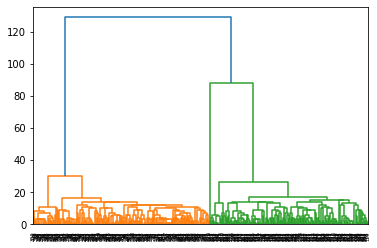

In [414]:
plot_dendrogram(x_result)

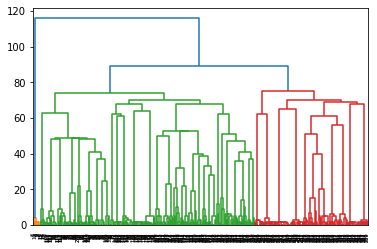

In [415]:
plot_dendrogram(y_result)

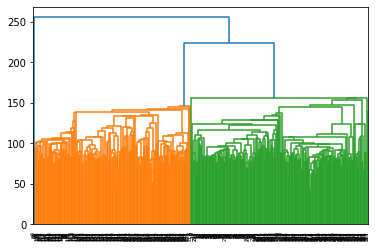

In [416]:
cumulative_matrix = np.zeros((len(x_center), 2))

for i in range(0, len(x_center)):
    cumulative_matrix[i][0] = x_center[i]
    cumulative_matrix[i][1] = y_center[i]

euc_cum = AgglomerativeClustering(n_clusters=x_clust* y_clust, affinity='euclidean', compute_distances=True ,linkage='single')
euc_result = euc_cum.fit(cumulative_matrix)
plot_dendrogram(euc_result)

In [417]:
# import euclidean pairwise_distances
from sklearn.metrics.pairwise import pairwise_distances

horizontal_threshold = 130
vertical_threshold = 32
columns = ['Id', 'Top', 'Bottom', 'Left', 'Right', 'Top_Box', 'Bottom_Box', 'Left_Box', 'Right_Box']

# data_new = np.empty((len(x_center), len(columns)) , dtype=object)
data_new = []

for i in range(0, len(x_center)):
    id = i
    df.reset_index()
    row_df = df[df['Id'] == id]
    row_df.reset_index()
    top = int(row_df['Top-Left'].iloc[0].split(',')[1][:-1])
    bottom = int(row_df['Bottom-Right'].iloc[0].split(',')[1][:-1])
    left = int(row_df['Top-Left'].iloc[0].split(',')[0][1:])
    right = int(row_df['Bottom-Right'].iloc[0].split(',')[0][1:])

    top_edge = [(right+left)//2, top]
    bottom_edge = [(right+left)//2, bottom]
    left_edge = [left, (top+bottom)//2]
    right_edge = [right, (top+bottom)//2]


    top_box = [np.inf, -1] # [distance, id]
    bottom_box = [np.inf, -1]
    left_box = [np.inf, -1]
    right_box = [np.inf, -1]

    for j in range(0, len(x_center)):
        if i != j:
            if x_center_abs[i][j] < horizontal_threshold and y_center_abs[i][j] <vertical_threshold:
                dist = pairwise_distances([[x_center[i], y_center[i]]], [[x_center[j], y_center[j]]], metric='euclidean') # assuming this what they meant by distance
                if x_center[i] > x_center[j] and dist < left_box[0]:
                    left_box[0] = dist
                    left_box[1] = j
                if x_center[i] < x_center[j] and dist < right_box[0]:
                    right_box[0] = dist
                    right_box[1] = j
                if y_center[i] > y_center[j] and dist < top_box[0]:
                    top_box[0] = dist
                    top_box[1] = j
                if y_center[i] < y_center[j] and dist < bottom_box[0]:
                    bottom_box[0] = dist
                    bottom_box[1] = j
    
    if top_box[1] == -1:
        top_box = [-1,0]
    if bottom_box[1] == -1:
        bottom_box = [-1,0]
    if left_box[1] == -1:
        left_box = [-1,0]
    if right_box[1] == -1:
        right_box = [-1,0]


    data_new.append([id, top_edge, bottom_edge, left_edge, right_edge, top_box, bottom_box, left_box, right_box])


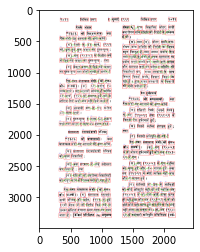

In [418]:
data_new_p = pd.DataFrame(data_new, columns = columns)
r_image = make_connections(img, data_new_p)
plt.imshow(r_image)

### The above was my code for Assignment 2.

#### I shall convert some of the above into functions for the sake of modularity

In [419]:
# finds the centers 
def find_centers (df):
    x_center = []
    y_center = []

    for row in df_temp.iterrows():
        row_id = row[1]['Id']
        row_df = df_temp[df_temp['Id'] == row_id]

        top = int(row_df['Top-Left'].iloc[0].split(',')[1][:-1])
        bottom = int(row_df['Bottom-Right'].iloc[0].split(',')[1][:-1])
        left = int(row_df['Top-Left'].iloc[0].split(',')[0][1:])
        right = int(row_df['Bottom-Right'].iloc[0].split(',')[0][1:])

        center_x = (left + right) // 2
        center_y = (top + bottom) // 2
        x_center.append(center_x)
        y_center.append(center_y)

    x_center = np.array(x_center)
    y_center = np.array(y_center)

    return x_center, y_center

In [420]:
# finding the absolute distance between points
def find_abs_dist(x_center, y_center):
    x_center_abs = np.zeros((len(x_center), len(x_center)))
    y_center_abs = np.zeros((len(y_center), len(y_center)))

    for i in range(0,len(x_center)):
        for j in range(i, len(x_center)):
            dist_x = np.absolute(x_center[i] - x_center[j])
            dist_y = np.absolute(y_center[i] - y_center[j])
            x_center_abs[i][j] = dist_x
            y_center_abs[i][j] = dist_y
            x_center_abs[j][i] = dist_x
            y_center_abs[j][i] = dist_y

    return x_center_abs, y_center_abs

In [441]:
# finding the euclidean distance between points

from sklearn.metrics.pairwise import pairwise_distances
def euclidean_func(h_t, v_t, columns, df, x_center_abs, y_center_abs, x_center, y_center):
    # import euclidean pairwise_distances

    horizontal_threshold = h_t
    vertical_threshold = v_t
    columns = columns

    # data_new = np.empty((len(x_center), len(columns)) , dtype=object)
    data_new = []

    for i in range(0, len(x_center)):
        id = i
        df.reset_index()
        row_df = df[df['Id'] == id]
        row_df.reset_index()
        top = int(row_df['Top-Left'].iloc[0].split(',')[1][:-1])
        bottom = int(row_df['Bottom-Right'].iloc[0].split(',')[1][:-1])
        left = int(row_df['Top-Left'].iloc[0].split(',')[0][1:])
        right = int(row_df['Bottom-Right'].iloc[0].split(',')[0][1:])

        top_edge = [(right+left)//2, top]
        bottom_edge = [(right+left)//2, bottom]
        left_edge = [left, (top+bottom)//2]
        right_edge = [right, (top+bottom)//2]


        top_box = [np.inf, -1] # [distance, id]
        bottom_box = [np.inf, -1]
        left_box = [np.inf, -1]
        right_box = [np.inf, -1]

        for j in range(0, len(x_center)):
            if i != j:
                if x_center_abs[i][j] < horizontal_threshold and y_center_abs[i][j] <vertical_threshold:
                    dist = pairwise_distances([[x_center[i], y_center[i]]], [[x_center[j], y_center[j]]], metric='euclidean') # assuming this what they meant by distance
                    if x_center[i] > x_center[j] and dist < left_box[0]:
                        left_box[0] = dist
                        left_box[1] = j
                    if x_center[i] < x_center[j] and dist < right_box[0]:
                        right_box[0] = dist
                        right_box[1] = j
                    if y_center[i] > y_center[j] and dist < top_box[0]:
                        top_box[0] = dist
                        top_box[1] = j
                    if y_center[i] < y_center[j] and dist < bottom_box[0]:
                        bottom_box[0] = dist
                        bottom_box[1] = j
        
        if top_box[1] == -1:
            top_box = [-1,0]
        if bottom_box[1] == -1:
            bottom_box = [-1,0]
        if left_box[1] == -1:
            left_box = [-1,0]
        if right_box[1] == -1:
            right_box = [-1,0]


        data_new.append([id, top_edge, bottom_edge, left_edge, right_edge, top_box, bottom_box, left_box, right_box])
    
    return data_new

In [442]:
# showing an image with the connections

def return_image(data, img, columns):
    data_new_p = pd.DataFrame(data, columns = columns)
    r_image = make_connections(img, data_new_p)
    return r_image

def show_image(data, img, columns):
    data_new_p = pd.DataFrame(data, columns = columns)
    r_image = make_connections(img, data_new_p)
    plt.subplots(1,1 , figsize=(20,10))
    plt.title('Image with Bounding Boxes and Connections')
    plt.imshow(r_image)

def show_bboxes(euclidean, image, columns):
    data_new_p = pd.DataFrame(euclidean, columns = columns)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image_with_boxes = image_rgb.copy()

    for index, row in data_new_p.iterrows():
        left = int(row['Left'][0])
        right = int(row['Right'][0])
        top = int(row['Top'][1])
        bottom = int(row['Bottom'][1])
        box_id = int(row['Id'])

        width = right - left
        height = bottom - top

        top_left = (left, top)
        bottom_right = (right, bottom)

        cv2.rectangle(image_with_boxes, top_left, bottom_right, (255, 0, 0), 2)

    r_image = image_with_boxes
    plt.subplots(1,1 , figsize=(20,10))
    plt.title('Image with Bounding Boxes')
    plt.imshow(r_image)

        

In [443]:
# making a pipeline function which just takes an input of an image number and their standard threshold

def normal_pipeline(image_no):
    csv_path = './CSV/TLBR_' +  str(image_no) + '.csv'
    df = pd.read_csv(csv_path)
    image_path = './images/' + str(image_no) + '.jpg'
    img = cv2.imread(image_path)

    x_center, y_center = find_centers(df)
    x_center_abs, y_center_abs = find_abs_dist(x_center, y_center)
    
    columns = ['Id', 'Top', 'Bottom', 'Left', 'Right', 'Top_Box', 'Bottom_Box', 'Left_Box', 'Right_Box']

    x_threshold = 130
    y_threshold = 32

    data_new = euclidean_func(x_threshold, y_threshold, columns, df, x_center_abs, y_center_abs, x_center, y_center)

    show_bboxes(data_new, img, columns)
    show_image(data_new, img, columns)

    print("Image number: ", image_no)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img)
    ax[0].set_title('Original Image')

    ax[1].imshow(r_image)
    ax[1].set_title('Image with connections')
    plt.show()
    plt.close()


Image number:  29


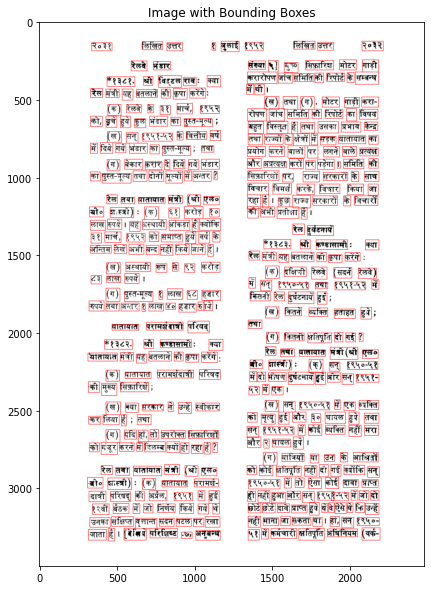

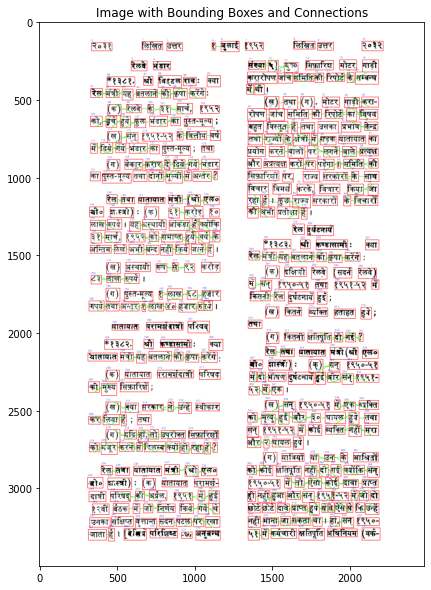

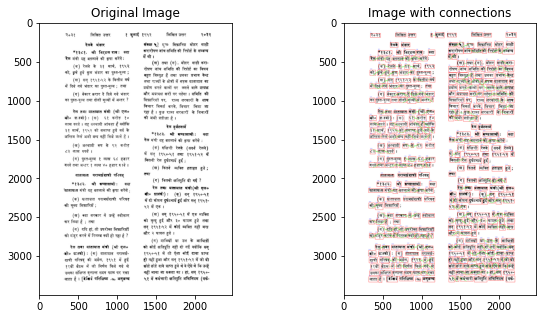

In [444]:
normal_pipeline(29)

In [425]:
# some helper functions

def threshold_func_x (x_bandwidth, x_center):

    density_threshold = 0.0001
    difference_threshold = 5

    lin_x = np.linspace(0, 3000, 3000).reshape(-1,1) # making a linear space for the x axis

    # running the model on it to visualise the data
    x_kde = KDE(kernel_type='gaussian') 
    x_kde.fit(X=x_center, bandwidth=x_bandwidth)
    print('X threshold kernel density plot')
    x_kde.visualisedata(lin_x)

    # getting the densities
    xdensities = x_kde.helper_function(lin_x)

    # we now have the densities of the points. places where density is less than 0.0001 are the points where there is a gap

    # identify the points where the density is less than 0.0001 
    less_dense_x = np.where(xdensities < density_threshold)[0]

    # we then try to find the points where difference between the next point is greater than 5 and previous point is greater than 5
    x_differnce_next = np.diff(less_dense_x)
    x_differnce_prev = np.diff(less_dense_x , prepend=0)

    # we then take an average of the difference between the start and end points. This will be the threshold
    x_start_points = np.where(x_differnce_next > difference_threshold)[0]
    x_end_points = np.where(x_differnce_prev > difference_threshold)[0]
    x_threshold = np.mean(less_dense_x[x_end_points] - less_dense_x[x_start_points]).astype('int')
    return x_threshold

def threshold_func_y (y_bandwidth, y_center):

    density_threshold = 0.0005
    difference_threshold = 5

    lin_y = np.linspace(0, 4000, 4000).reshape(-1,1) # making a linear space for the x axis

    # running the model on it to visualise the data
    y_kde = KDE(kernel_type='gaussian')
    y_kde.fit(X=y_center, bandwidth=y_bandwidth)
    print('Y threshold kernel density plot')
    y_kde.visualisedata(lin_y)

    # getting the densities
    ydensities = y_kde.helper_function(lin_y)

    # we now have the densities of the points. places where density is less than 0.0005 are the points where there is a gap

    # identify the points where the density is less than 0.0005
    less_dense_y = np.where(ydensities < density_threshold)[0]

    # we then try to find the points where difference between the next point is greater than 5 and previous point is greater than 5
    y_differnce_next = np.diff(less_dense_y)
    y_differnce_prev = np.diff(less_dense_y , prepend=0)

    # we then take an average of the difference between the start and end points. This will be the threshold
    y_start_points = np.where(y_differnce_next > difference_threshold)[0]
    y_end_points = np.where(y_differnce_prev > difference_threshold)[0]
    y_threshold = np.mean(less_dense_y[y_end_points] - less_dense_y[y_start_points]).astype('int')

    return y_threshold
    

def threshold_func(x_bandwidth, y_bandwidth, x_center, y_center):
    x_t = threshold_func_x(x_bandwidth,x_center.reshape(-1,1))
    y_t = threshold_func_y(y_bandwidth,y_center.reshape(-1,1))
    return x_t, y_t
    

In [426]:
# making a pipeline integrated with a function to calculate optimum threshold on its own (instead of hierarchy). 
def kde_pipeline(image_no, x_bandwidth, y_bandwidth):
    csv_path = './CSV/TLBR_' +  str(image_no) + '.csv'
    df = pd.read_csv(csv_path)
    image_path = './images/' + str(image_no) + '.jpg'
    img = cv2.imread(image_path)

    x_center, y_center = find_centers(df)
    x_center_abs, y_center_abs = find_abs_dist(x_center, y_center)
    
    columns = ['Id', 'Top', 'Bottom', 'Left', 'Right', 'Top_Box', 'Bottom_Box', 'Left_Box', 'Right_Box']

    x_threshold, y_threshold = threshold_func(x_bandwidth, y_bandwidth, x_center , y_center)
    print("Vertical Threshold" , x_threshold)
    print("Horizontal threshold", y_threshold)

    data_new = euclidean_func(y_threshold, x_threshold, columns, df, x_center_abs, y_center_abs, x_center, y_center)


    print("Image number: ", image_no)
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].imshow(img)
    ax[0].set_title('Original Image')

    # this prints out image on the basis of the thresholds obtained from KDE. The connections are based on these threshold
    r = return_image(data_new, img, columns)
    ax[1].imshow(r)
    ax[1].set_title('Image with connections')
    plt.show()
    plt.close()


X threshold kernel density plot


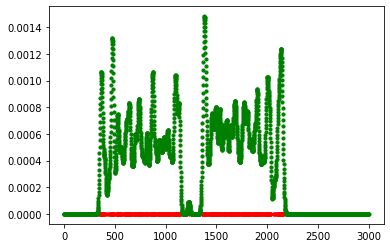

Y threshold kernel density plot


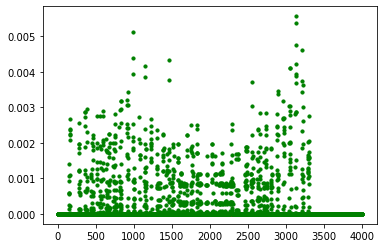

Vertical Threshold 822
Horizontal threshold 9
Image number:  29


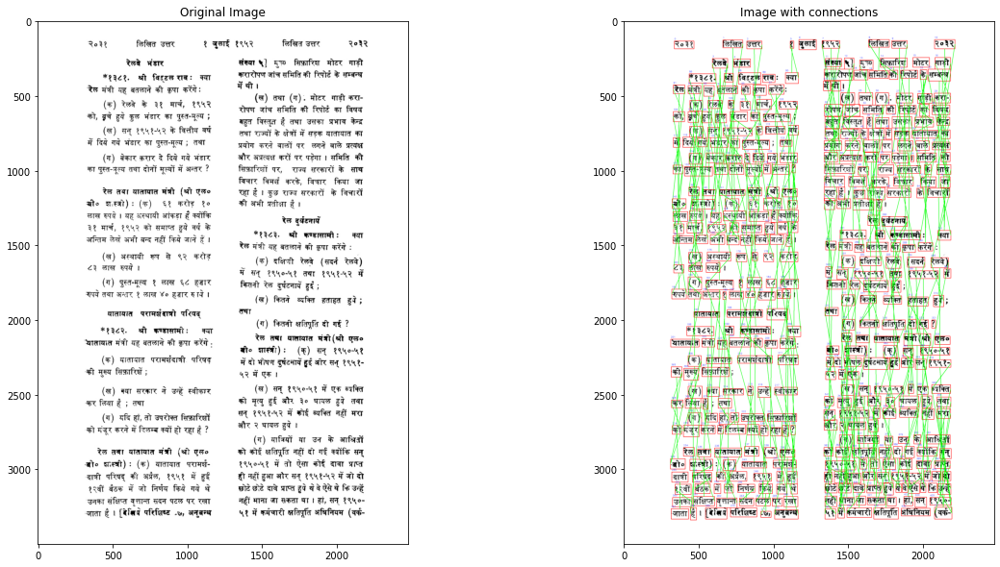

In [427]:
kde_pipeline(29,10,1)

In [428]:
bandwidths = [[5,1] , [10,2], [25,5] , [50,10]]

def print_images(image_indexes, bandwidths):
    print("Image number: ", image_indexes)
    for j in range(0, len(bandwidths)):
        print("Bandwidth: ", bandwidths[j])
        kde_pipeline(image_indexes, bandwidths[j][0], bandwidths[j][1])
        print("\n")

## Note that all the below connections are based on thresholds given by KDE and are not the actual connections

Image number:  29
Bandwidth:  [5, 1]
X threshold kernel density plot


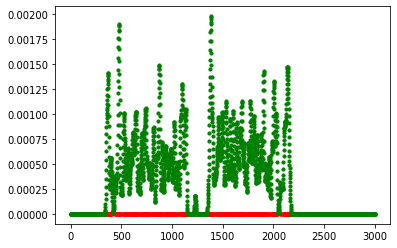

Y threshold kernel density plot


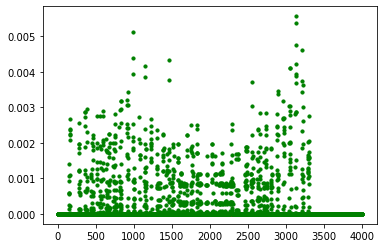

Vertical Threshold 321
Horizontal threshold 9
Image number:  29


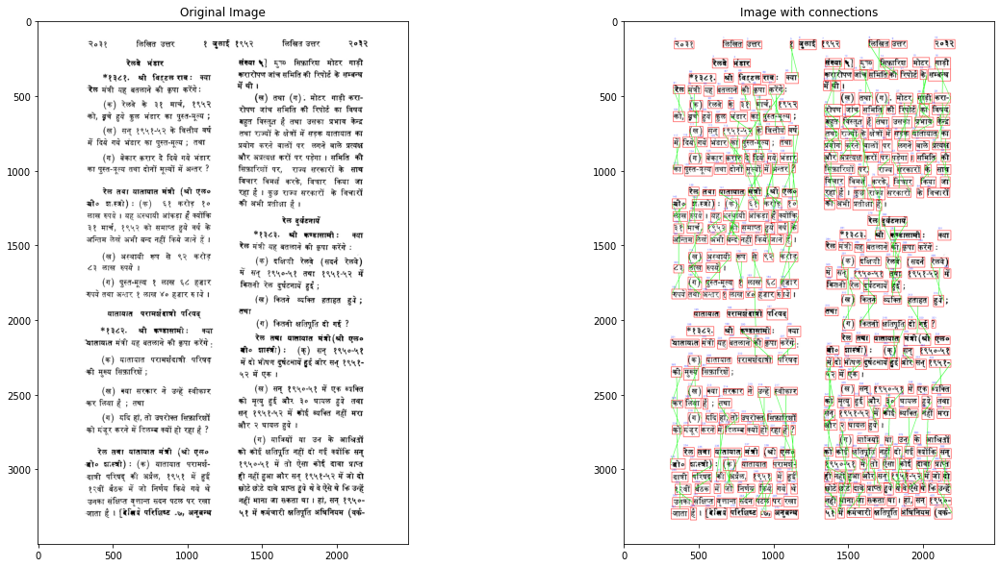



Bandwidth:  [10, 2]
X threshold kernel density plot


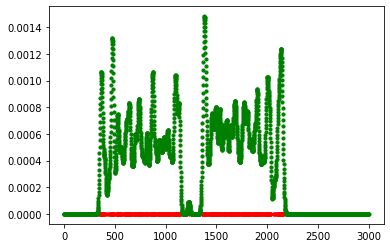

Y threshold kernel density plot


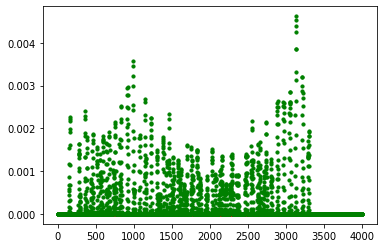

Vertical Threshold 822
Horizontal threshold 12
Image number:  29


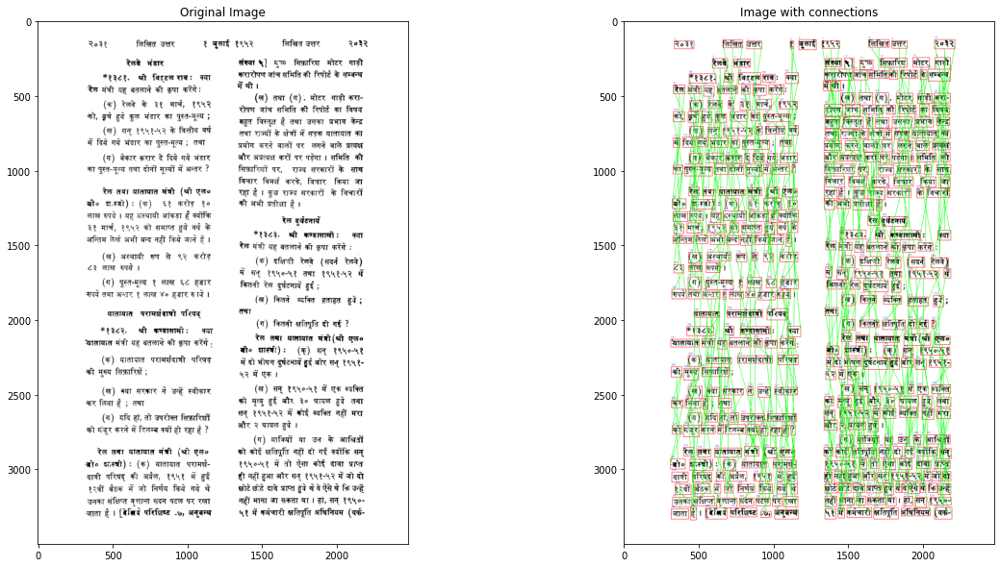



Bandwidth:  [25, 5]
X threshold kernel density plot


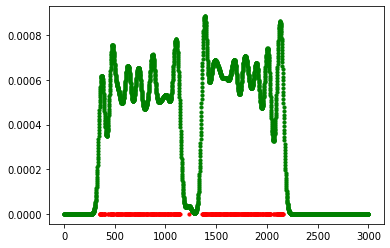

Y threshold kernel density plot


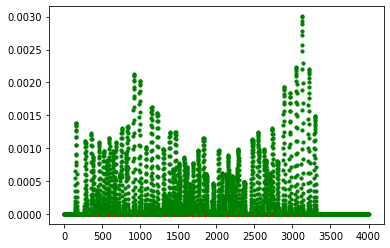

Vertical Threshold 862
Horizontal threshold 18
Image number:  29


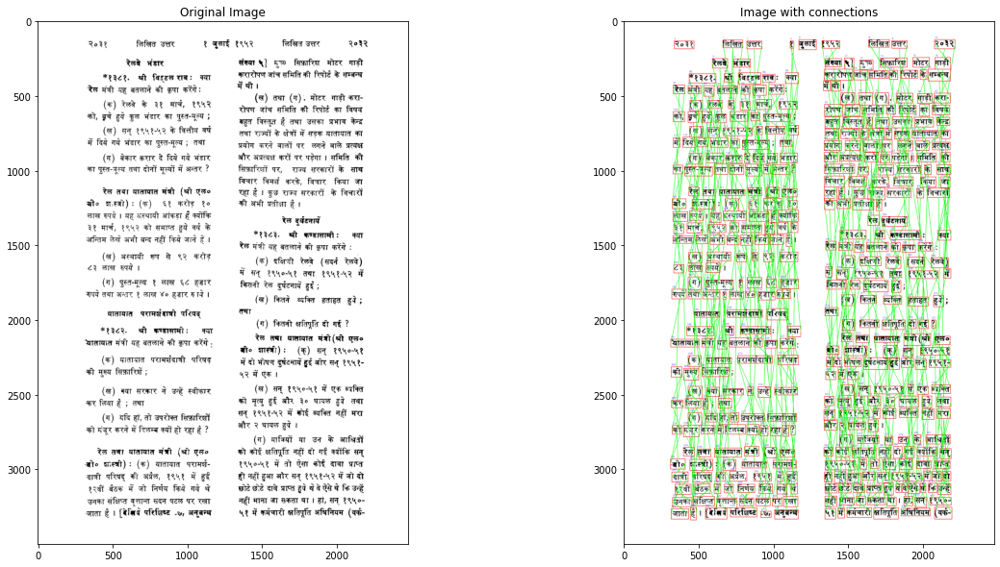



Bandwidth:  [50, 10]
X threshold kernel density plot


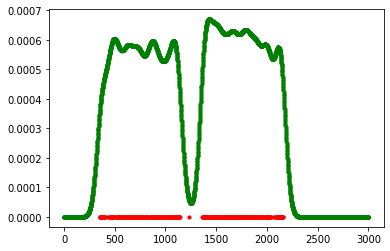

Y threshold kernel density plot


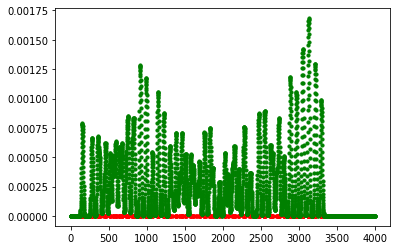

Vertical Threshold 928
Horizontal threshold 21
Image number:  29


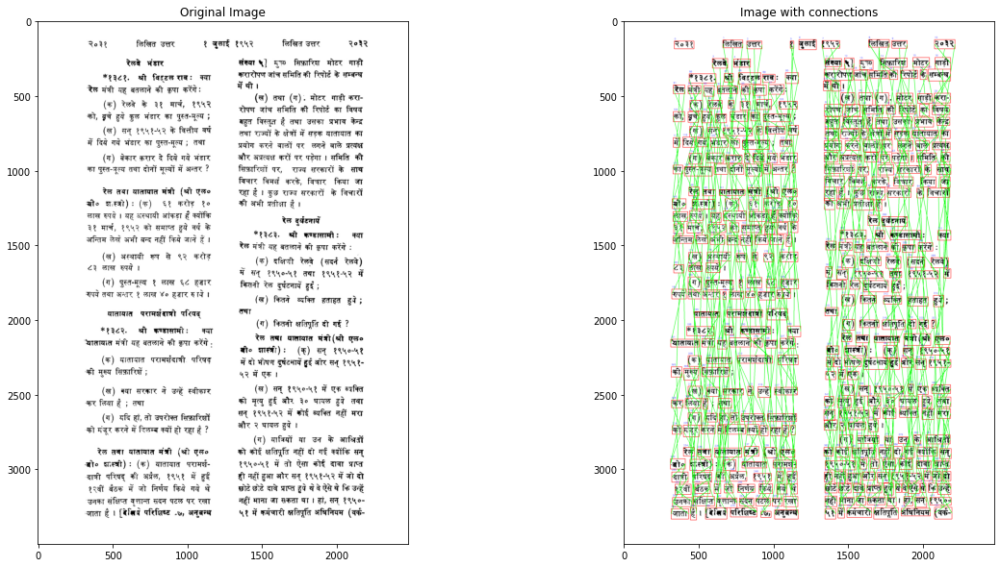

In [430]:
print_images(29, bandwidths)

Image number:  68
Bandwidth:  [5, 1]
X threshold kernel density plot


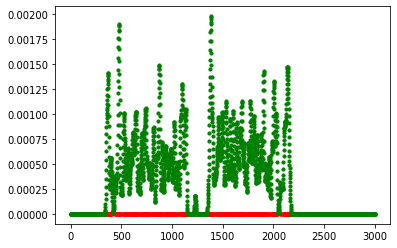

Y threshold kernel density plot


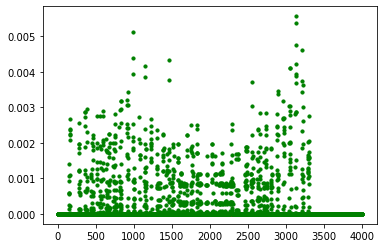

Vertical Threshold 321
Horizontal threshold 9
Image number:  68


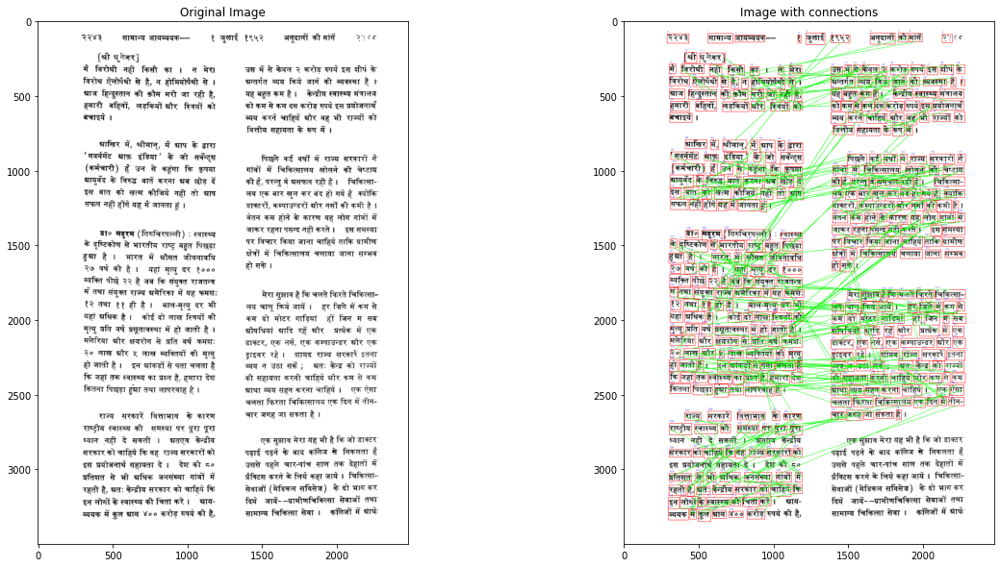



Bandwidth:  [10, 2]
X threshold kernel density plot


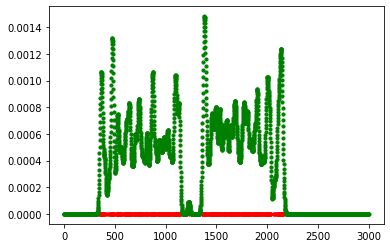

Y threshold kernel density plot


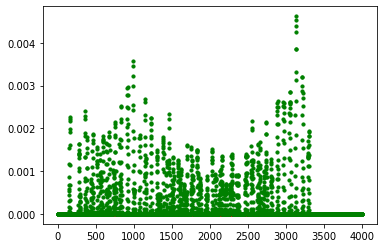

Vertical Threshold 822
Horizontal threshold 12
Image number:  68


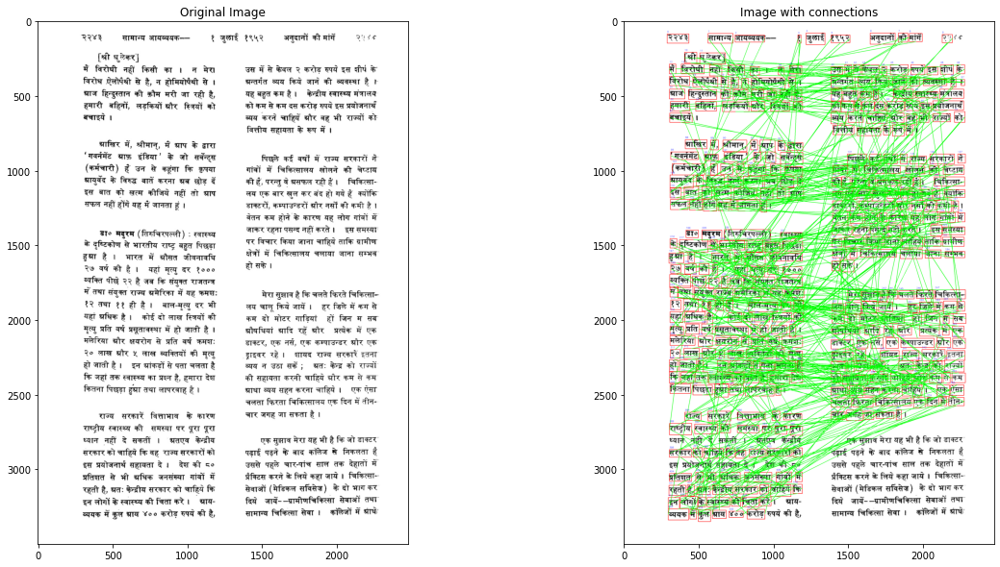



Bandwidth:  [25, 5]
X threshold kernel density plot


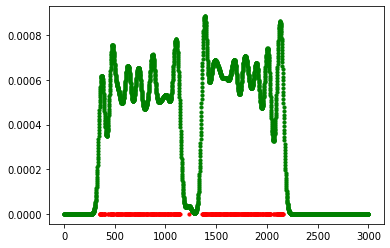

Y threshold kernel density plot


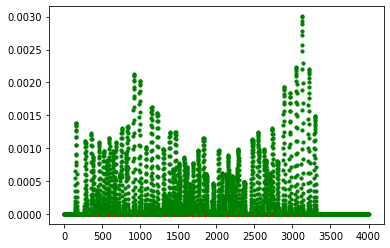

Vertical Threshold 862
Horizontal threshold 18
Image number:  68


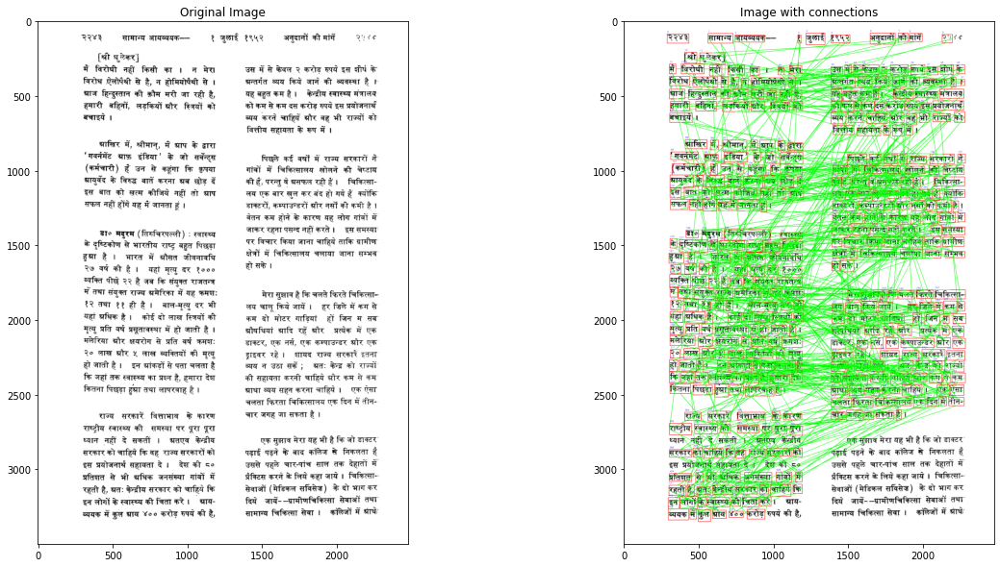



Bandwidth:  [50, 10]
X threshold kernel density plot


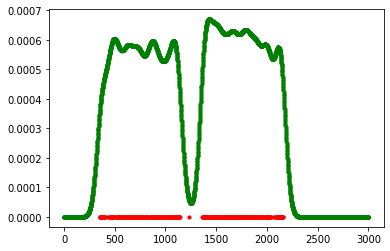

Y threshold kernel density plot


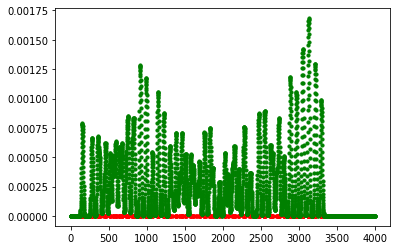

Vertical Threshold 928
Horizontal threshold 21
Image number:  68


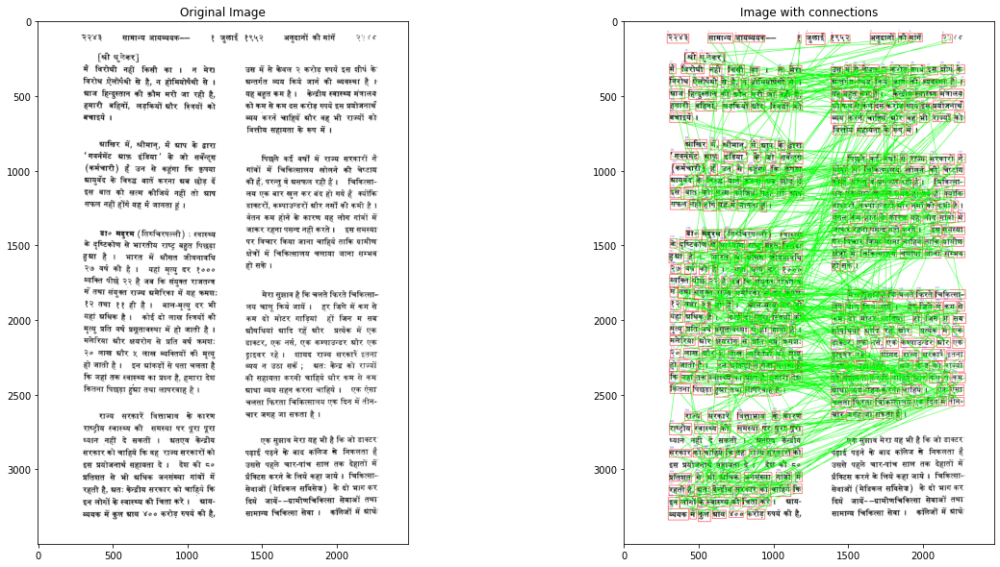

In [431]:
print_images(68, bandwidths)

Image number:  232
Bandwidth:  [5, 1]
X threshold kernel density plot


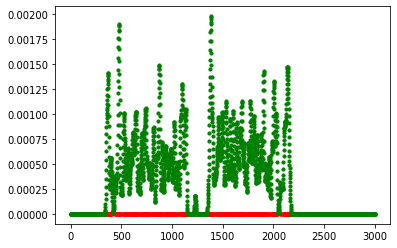

Y threshold kernel density plot


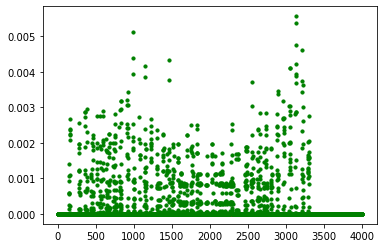

Vertical Threshold 321
Horizontal threshold 9
Image number:  232


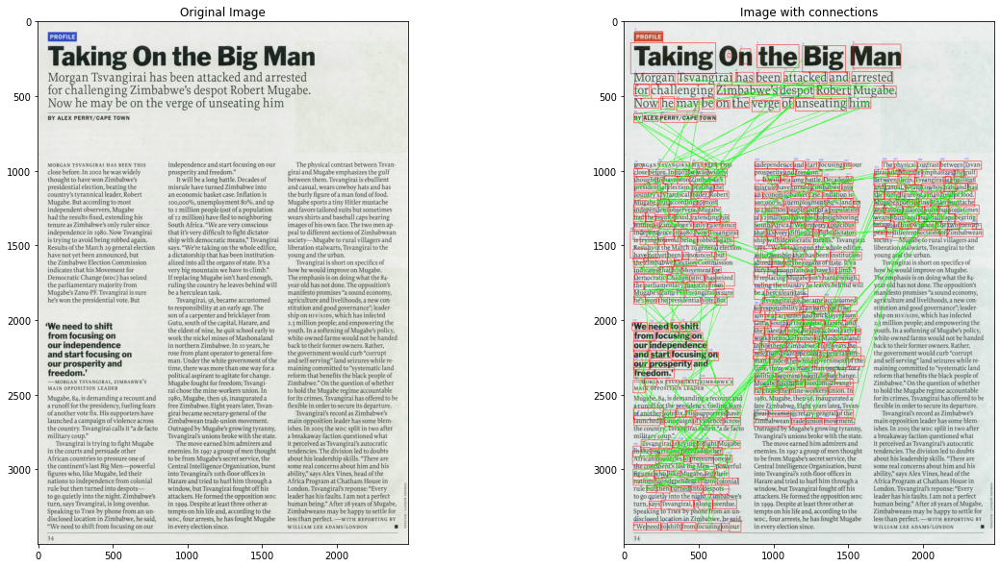



Bandwidth:  [10, 2]
X threshold kernel density plot


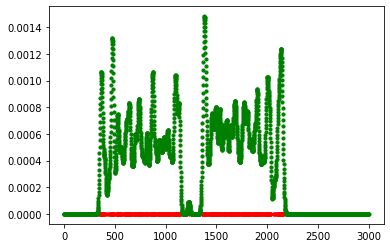

Y threshold kernel density plot


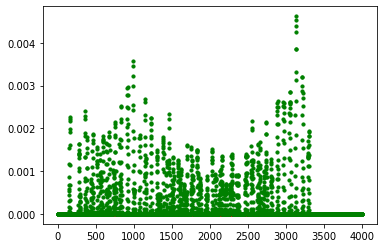

Vertical Threshold 822
Horizontal threshold 12
Image number:  232


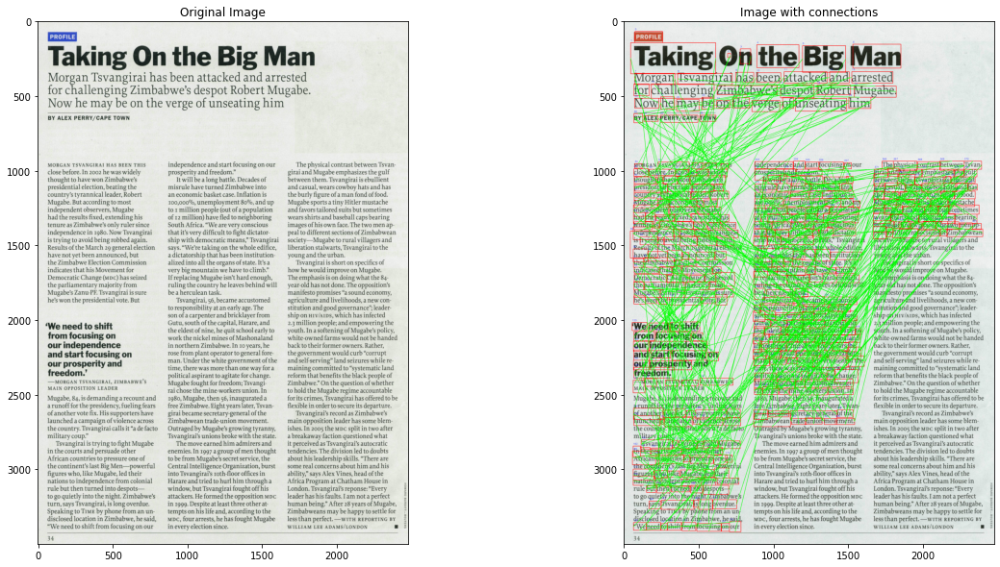



Bandwidth:  [25, 5]
X threshold kernel density plot


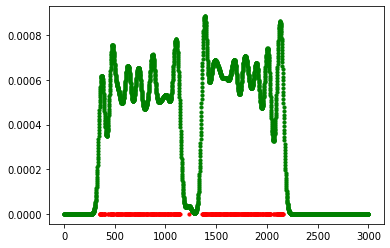

Y threshold kernel density plot


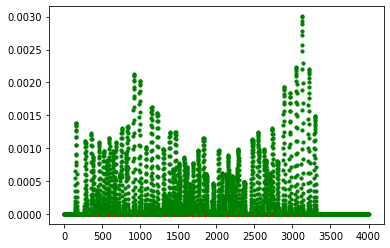

Vertical Threshold 862
Horizontal threshold 18
Image number:  232


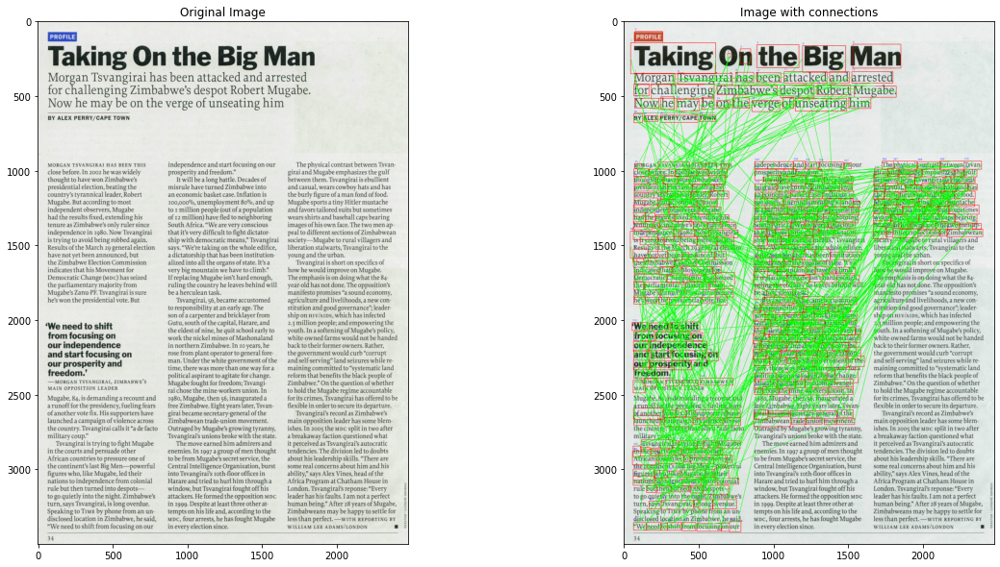



Bandwidth:  [50, 10]
X threshold kernel density plot


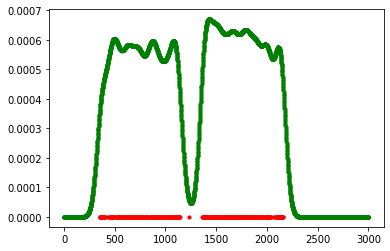

Y threshold kernel density plot


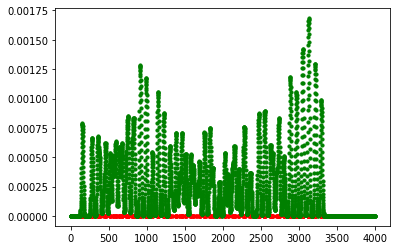

Vertical Threshold 928
Horizontal threshold 21
Image number:  232


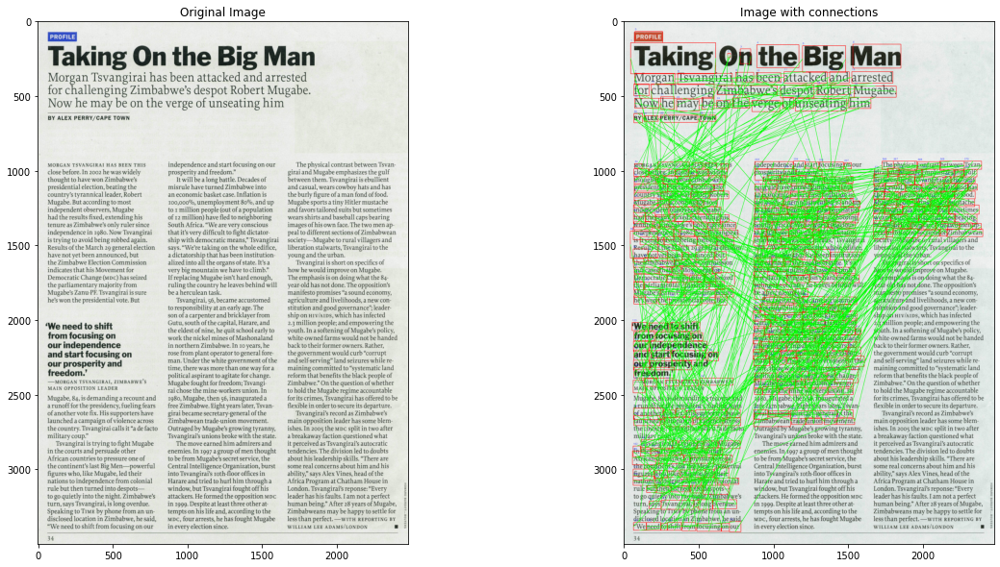

In [445]:
print_images(232, bandwidths)

Image number:  250
Bandwidth:  [5, 1]
X threshold kernel density plot


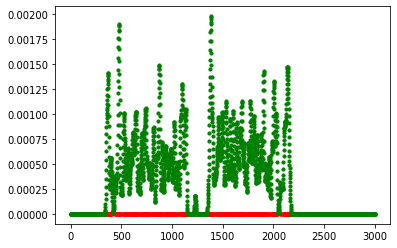

Y threshold kernel density plot


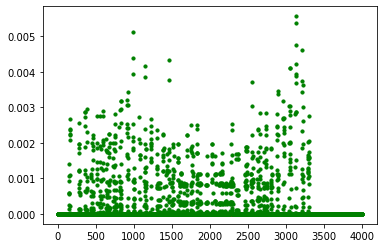

Vertical Threshold 321
Horizontal threshold 9
Image number:  250


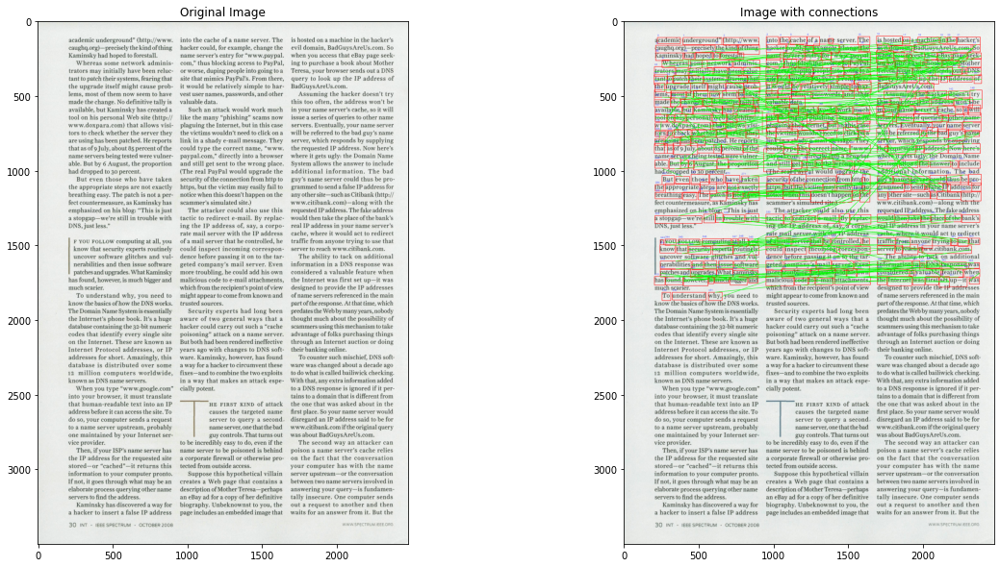



Bandwidth:  [10, 2]
X threshold kernel density plot


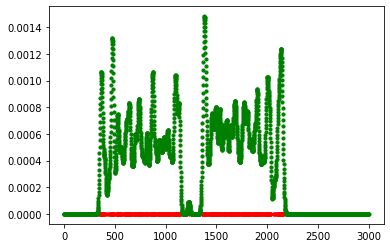

Y threshold kernel density plot


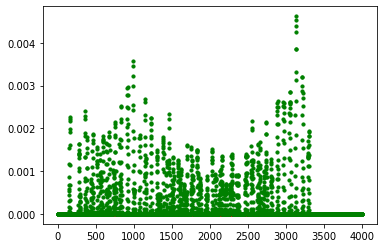

Vertical Threshold 822
Horizontal threshold 12
Image number:  250


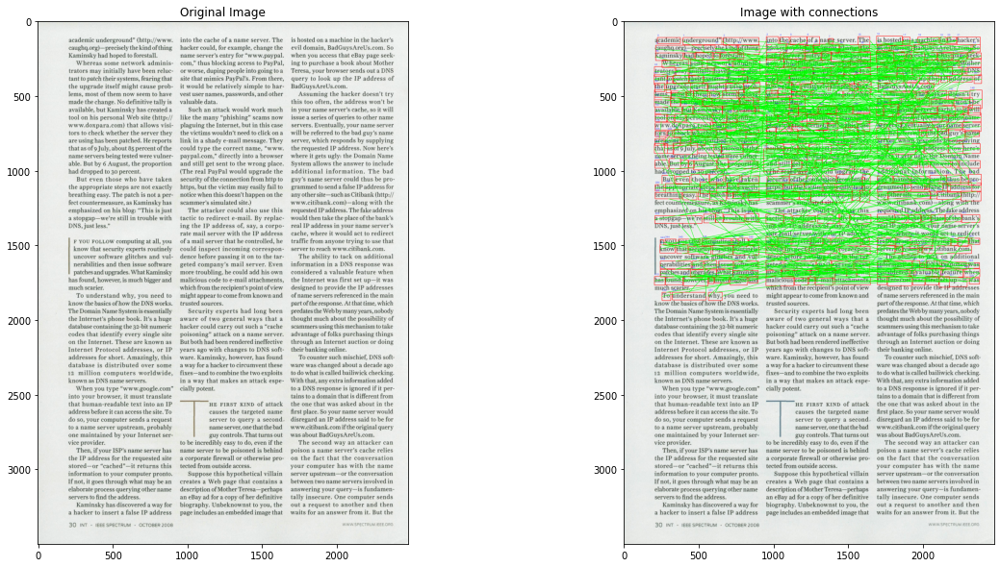



Bandwidth:  [25, 5]
X threshold kernel density plot


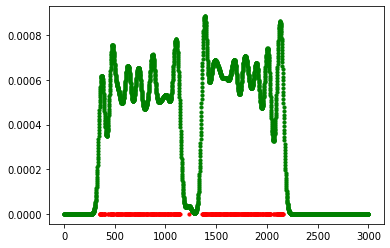

Y threshold kernel density plot


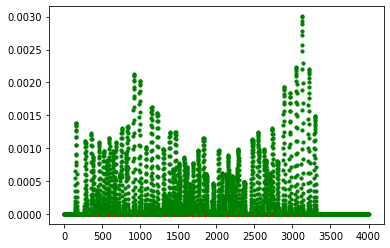

Vertical Threshold 862
Horizontal threshold 18
Image number:  250


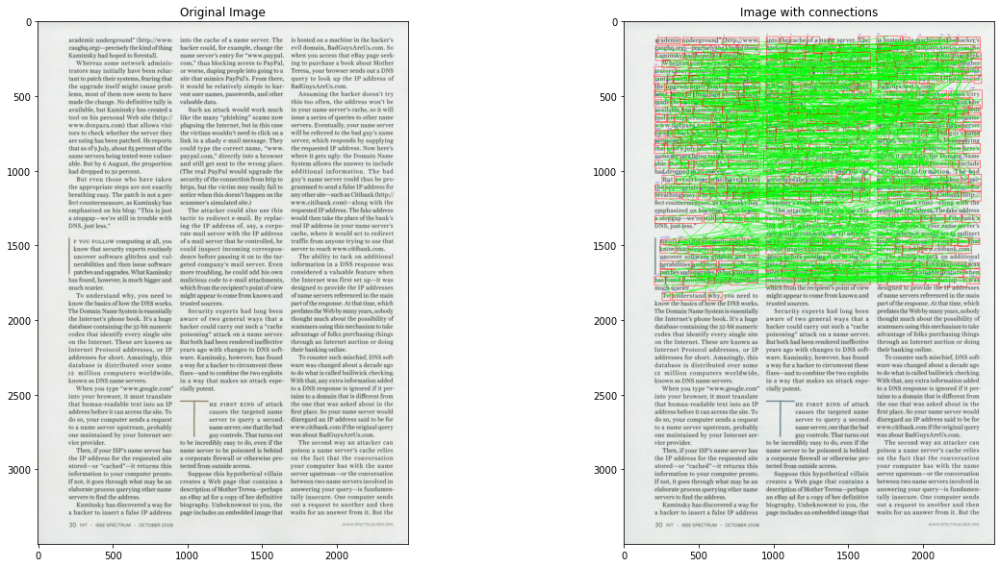



Bandwidth:  [50, 10]
X threshold kernel density plot


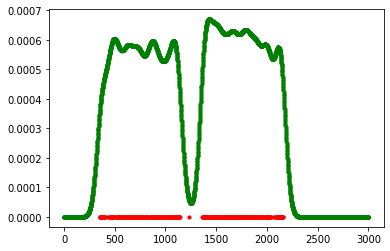

Y threshold kernel density plot


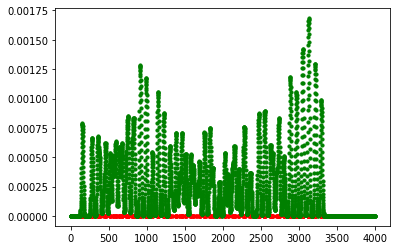

Vertical Threshold 928
Horizontal threshold 21
Image number:  250


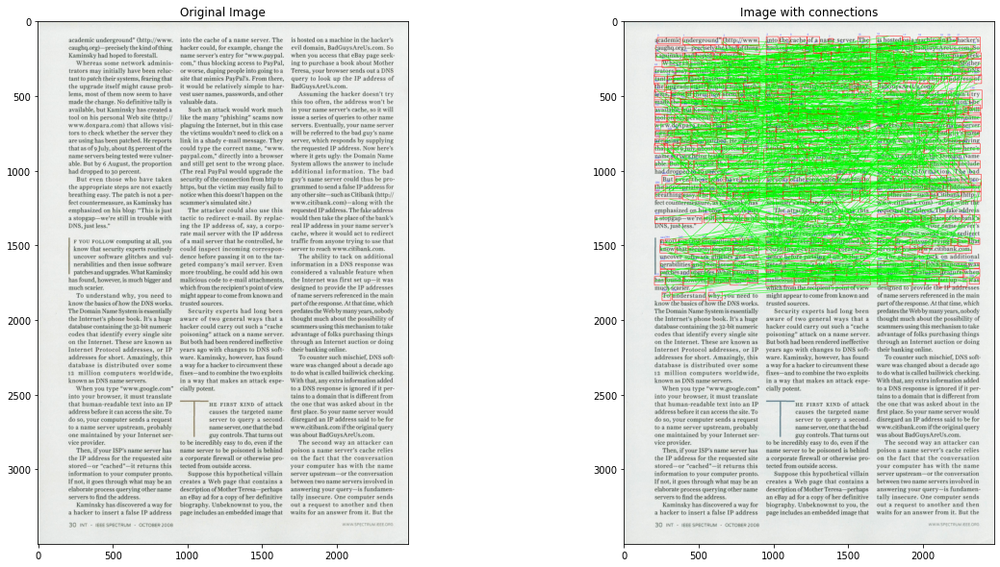

In [446]:
print_images(250, bandwidths)